## Appendix B: Elements of Calculus and Automatic Differentiation 

# B.7 Taylor series

In this Section we take everything we have just learned about higher order derivatives to define the *Taylor Series* of a function, a fundamental tool of calculus that is critically important for mathematical optimization (as detailed in Chapters 3 - 4).  We begin by deriving this crucial concept for general single-input functions, and follow by generalizing to the case of multi-input functions.

In [1]:
# This code cell will not be shown in the HTML version of this notebook
#imports from custom library
import sys
sys.path.append('../../')
import autograd.numpy as np
import matplotlib.pyplot as plt
from mlrefined_libraries import calculus_library as calclib

# this is needed to compensate for %matplotlib notebook's tendancy to blow up images when plotted inline
%matplotlib notebook
from matplotlib import rcParams
rcParams['figure.autolayout'] = True

## B.7.1  Linear approximation is only the beginning

We began our discussion of derivatives by defining the derivative at a point as the slope of the tangent line to a given input function.  For a function $g(w)$ we then formally described the tangent line at a point $w^0$ as 

\begin{equation}
h(w) = g(w^0) + \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)(w - w^0)
\end{equation}

with the slope here given by the derivative $\frac{\mathrm{d}}{\mathrm{d}w}g(w^0)$.  The justification for examining the tangent line / the derivative to begin with is fairly straight forward - locally (close to the point $w^0$) the tangent line looks awfully similar to the function, and so if we want to better understand $g$ near $w^0$ we can just as well look at the tangent line.  This makes our lives a lot easier because a line is a fairly simple object - especially when compared to an arbitrary function $g$ - and so understanding the tangent line is always a simple affair.

Below we plot an example function with tangent line defined by the derivative at a range of points over the interval $[-3,3]$.  You can use the slider below the figure to move the point $w^0$ around in this range and view the corresponding first order Taylor series approximation there (shown in green).  Here the derivative is being computed using an Automatic Differentiator.


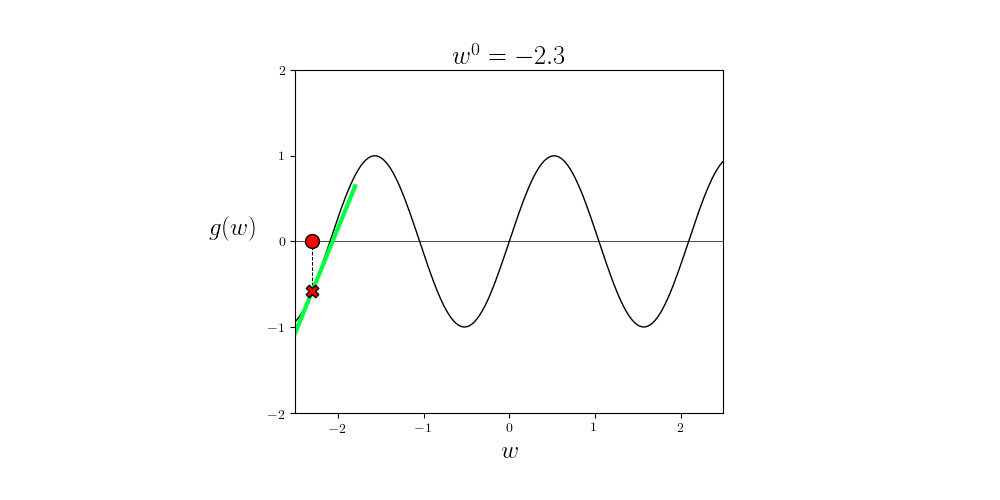
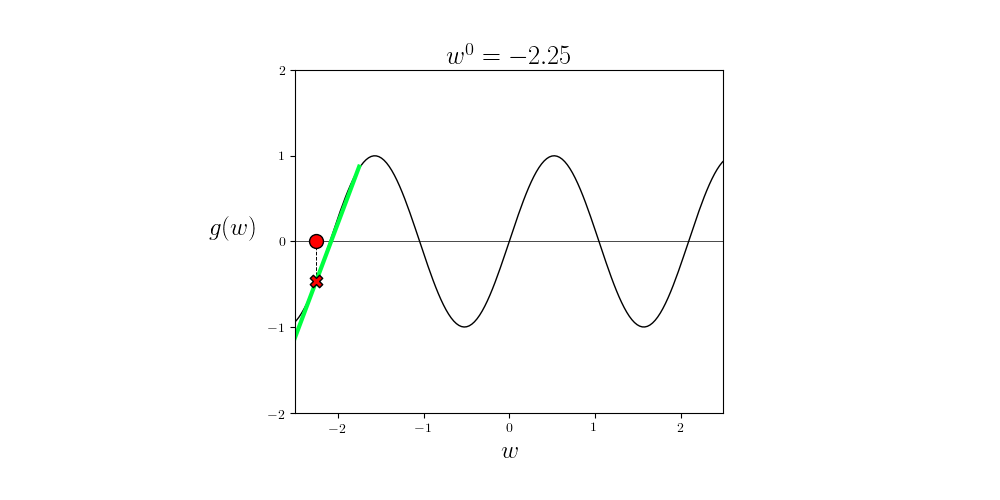
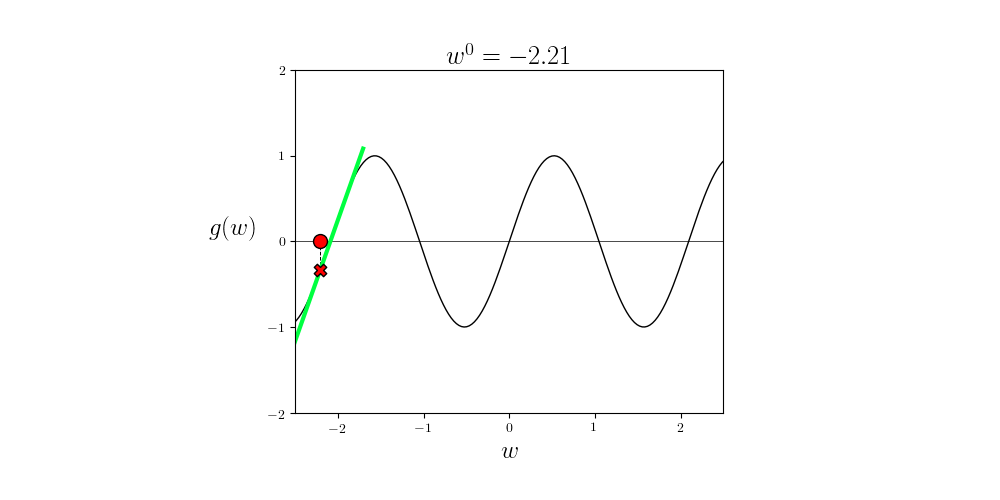
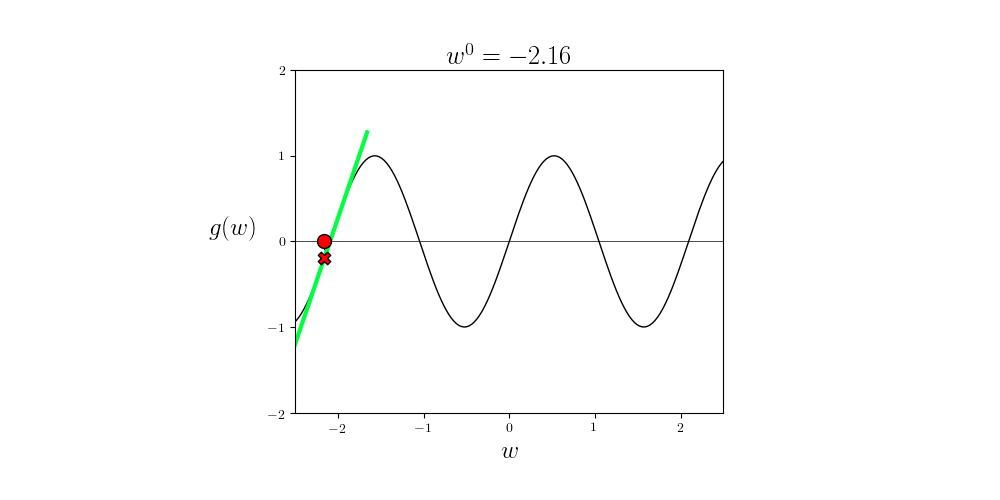
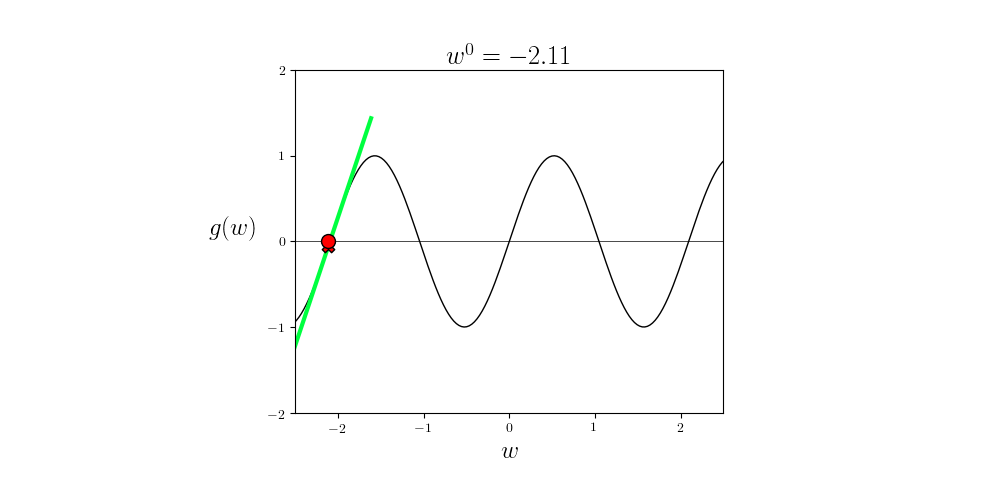
...
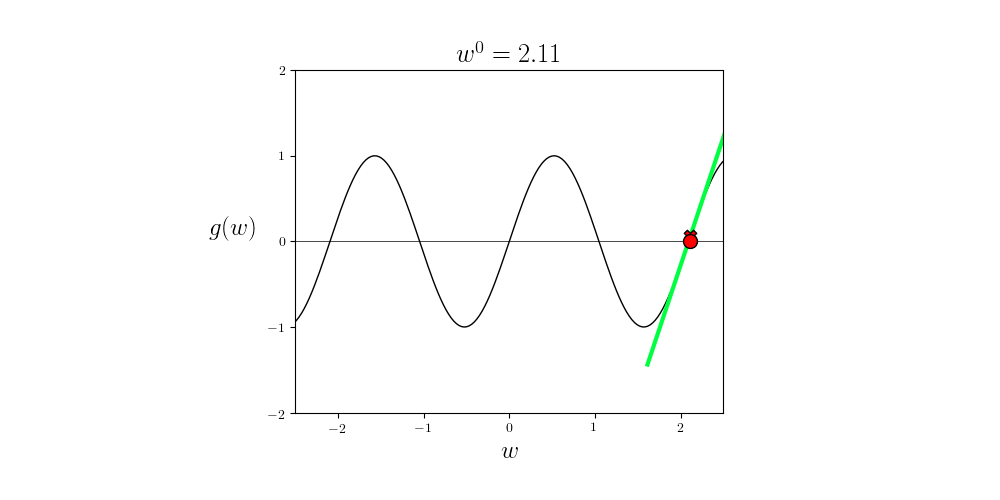
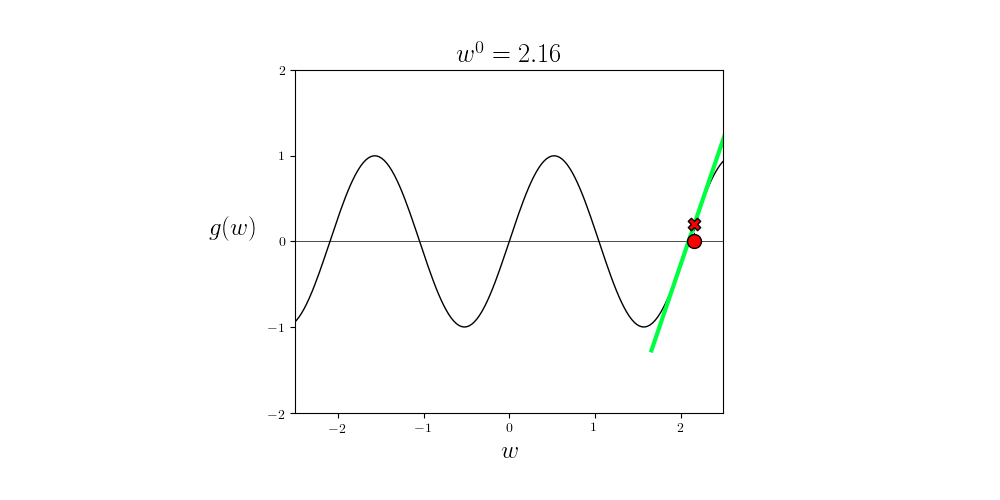
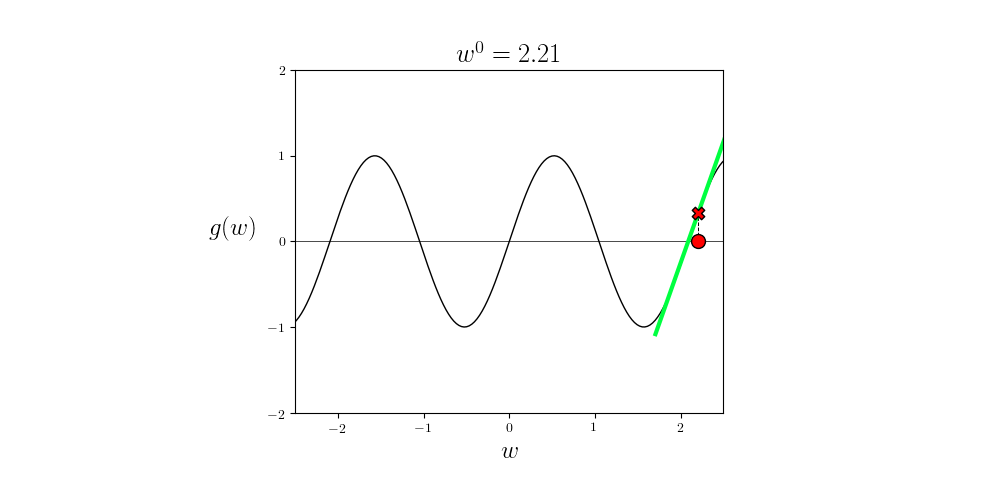
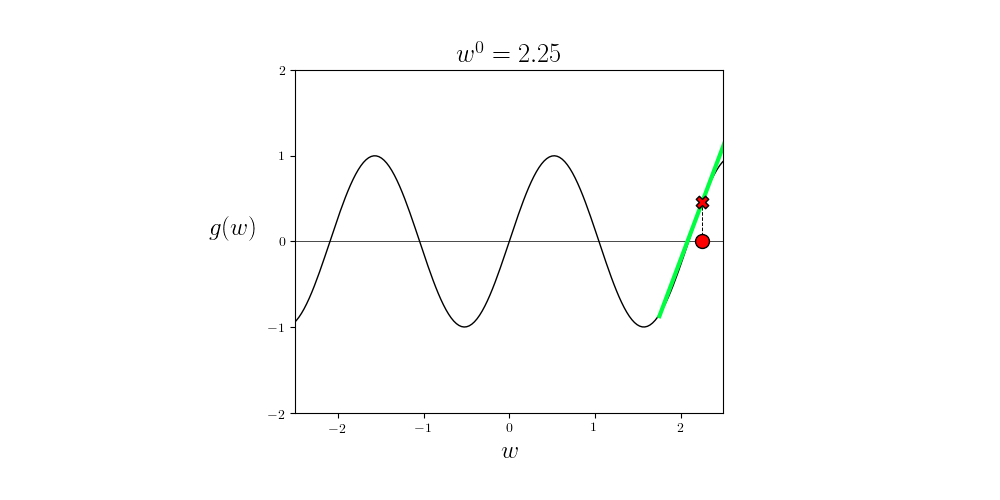
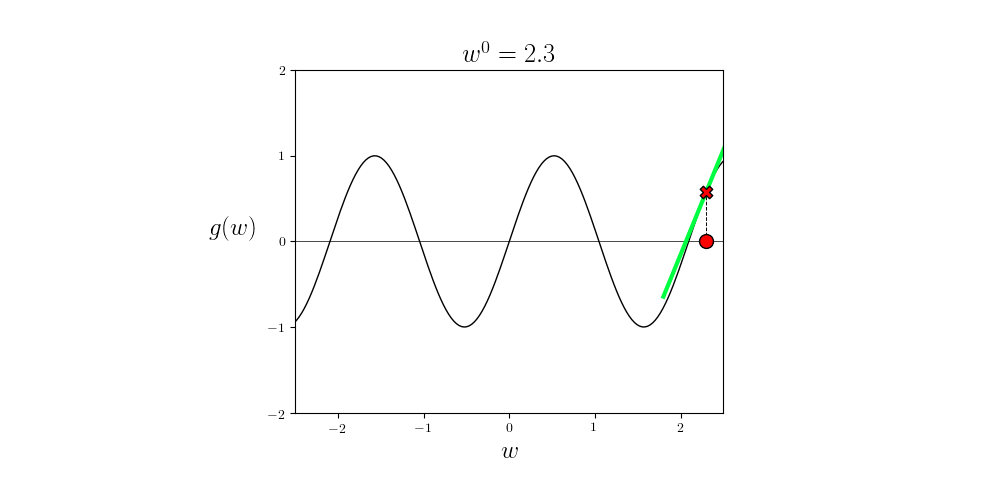

In [4]:
g = lambda w: np.sin(3*w);
test = calclib.taylor2d_viz.visualizer(g = g)
test.draw_it(num_frames = 100,first_order = True)

If we study the form of our tangent line $h(w)$ closely, we can define in precise mathematical terms how it matches the function $g$.  Notice first of all that the tangent line takes on the same value as the function $g$ at the point $w^0$.  Plugging in $w^0$ into $h$ we can see that

\begin{equation}
h(w^0) = g(w^0) + \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)(w^0 - w^0) = g(w^0)
\end{equation}

Next notice that the first derivative value of these two functions match as well.  That is if we take the first derivative of $h$ with respect to $w$ - applying the derivative rules for elementary functions/operations we have seen in the last several Sections - we can see that

\begin{equation}
\frac{\mathrm{d}}{\mathrm{d}w}h(w^0) = \frac{\mathrm{d}}{\mathrm{d}w}\left (g(w^0) + \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)(w - w^0)\right) = \frac{\mathrm{d}}{\mathrm{d}w}\left ( \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)(w - w^0)\right) = \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)
\end{equation}

In short, with the tangent line $h$ matches $g$ exactly that at $w^0$ both the function value and derivative value are equal.

\begin{array}
\
1. \,\,\, h(w^0) = g(w^0) \\
2. \,\,\, \frac{\mathrm{d}}{\mathrm{d}w}h(w^0) = \frac{\mathrm{d}}{\mathrm{d}w}g(w^0) \\
\end{array}

What if we turned this around - say we wanted to find a line that satisfies these two properties.  We start with a general line

\begin{equation}
h(w) = a_0 + a_1(w - w^0)
\end{equation}

with unknown coefficients $a_0$ and $a_1$ - and we want to determine the right value for these coefficients so that the line satisfy these two properties.  What would we do?  Well, since the two criteria above constitute a *system of equations* we can compute the left hand side of both and solve for the correct values of $a_0$ and $a_1$.  Computing the left hand side of each - where $h$ is our general line - we end up with a trivial system of equations to solve for both unknowns simultaneously

\begin{array}
\
h(w^0) = a_0  = g(w^0) \\
\frac{\mathrm{d}}{\mathrm{d}w}h(w^0) = a_1 = \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)
\end{array}

and behold, the coefficients are precisely those of the tangent line!  

In other words, if we start with a general line and determine parameter values that satisfy the two criteria above we could have derived the tangent line from first principles. 

## B.7.2  From tangent line to tangent quadratic

Given that the function and derivative values of the tangent line match those of its underlying function, can we do better?  Can we find a simple function that matches the function value, first derivative, *and* the second derivative value of $g$ at the point $w_0$?  In other words, is it possible to determine a simple function $h$ that satisfies

\begin{array}
\
1. \,\,\, h(w^0) = g(w^0) \\
2. \,\,\, \frac{\mathrm{d}}{\mathrm{d}w}h(w^0) = \frac{\mathrm{d}}{\mathrm{d}w}g(w^0) \\
3. \,\,\, \frac{\mathrm{d}^2}{\mathrm{d}w^2}h(w^0) = \frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0) \\
\end{array} 

Notice how a (tangent) line $h$ can only satisfy the first two of these properties and never the third, since it being a degree 1 polynomial $\frac{\mathrm{d}^2}{\mathrm{d}w^2}h(w) = 0$ for all $w$.  This fact implies that we need *at least* a degree 2 polynomial to satisfy all three criteria, since the second derivative of a degree 2 polynomial need not be equal to zero. 

What sort of degree 2 polynomial could satisfy these three criteria?  Starting with a general degree 2 polynomial 

\begin{equation}
h(w) = a_0 + a_1(w - w^0) + a_2(w - w^0)^2
\end{equation}

with unknown coefficients $a_0$, $a_1$, and $a_2$, we can evaluate the left hand side of each criterion forming a system of 3 equations and solve for these coefficients.


\begin{array}
\
h(w^0) = a_0 = g(w^0) \\
\frac{\mathrm{d}}{\mathrm{d}w}h(w^0) = a_1 = \frac{\mathrm{d}}{\mathrm{d}w}g(w^0) \\
 \frac{\mathrm{d}^2}{\mathrm{d}w^2}h(w^0) = 2a_2 = \frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0)\\
\end{array}

With all of our coefficients solved we have a degree 2 polynomial that satisfies the three desired criteria 

\begin{equation}
h(w) = g(w^0) + \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)(w - w^0) +  \frac{1}{2}\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0)(w - w^0)^2
\end{equation}

This is one step beyond the tangent line - a tangent quadratic function - note that the first two terms are indeed the tangent line itself.  

Below we plot an example function with its first and second order Taylor series approximations over a range of points on the interval $[-3,3]$.  You can use the slider below the figure to move the point $w^0$ around in this range and view the corresponding first / second order Taylor series approximation there (shown in green and blue respecively).  Here the derivatives are being computed using an Automatic Differentiator.


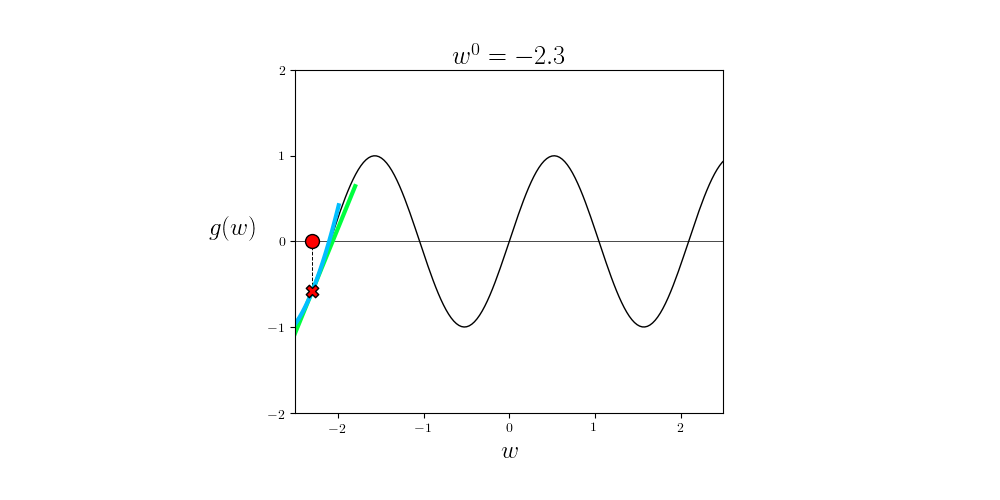
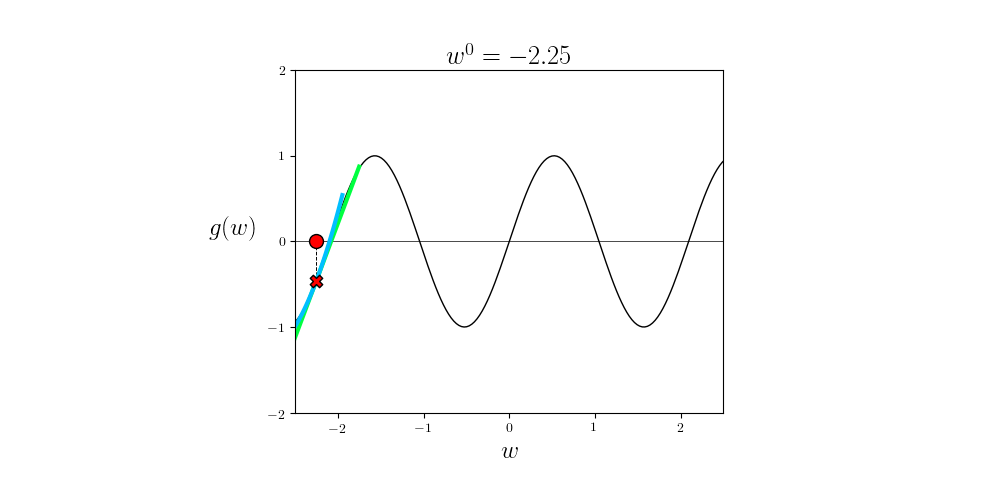
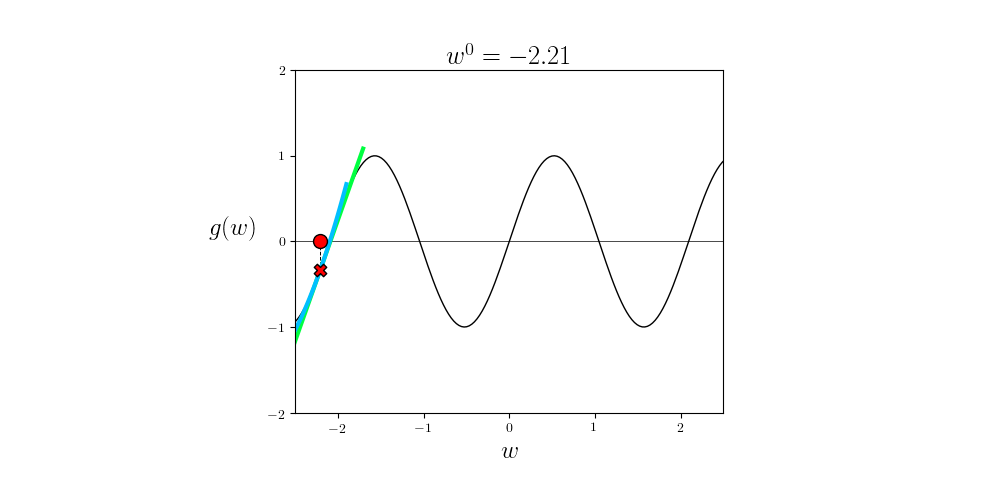
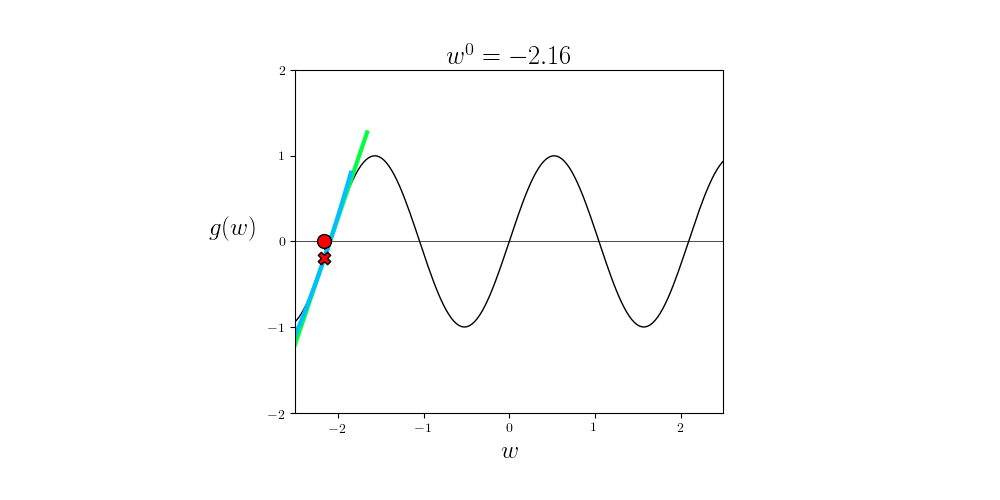
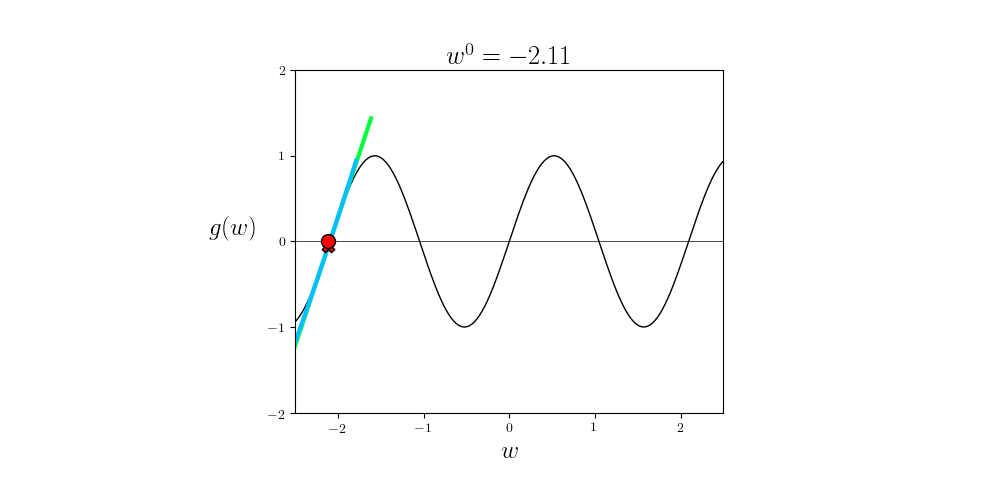
...
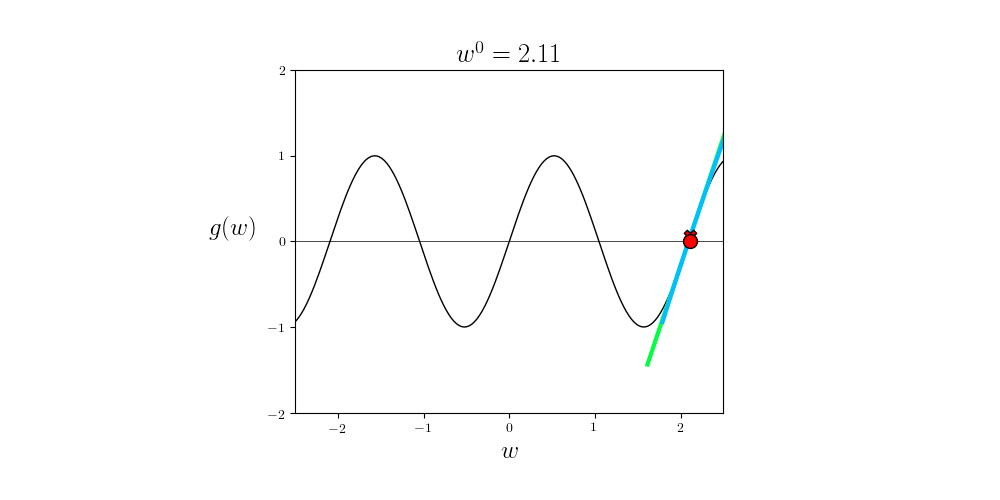
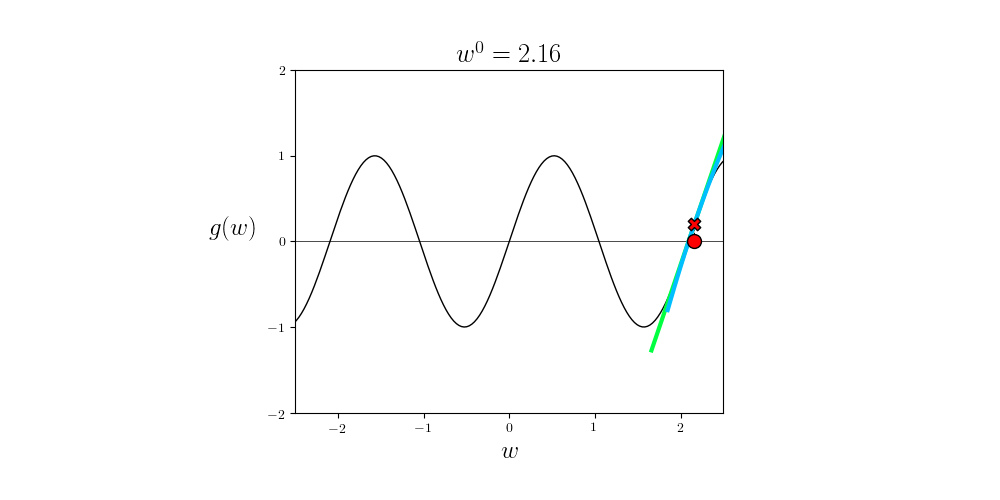
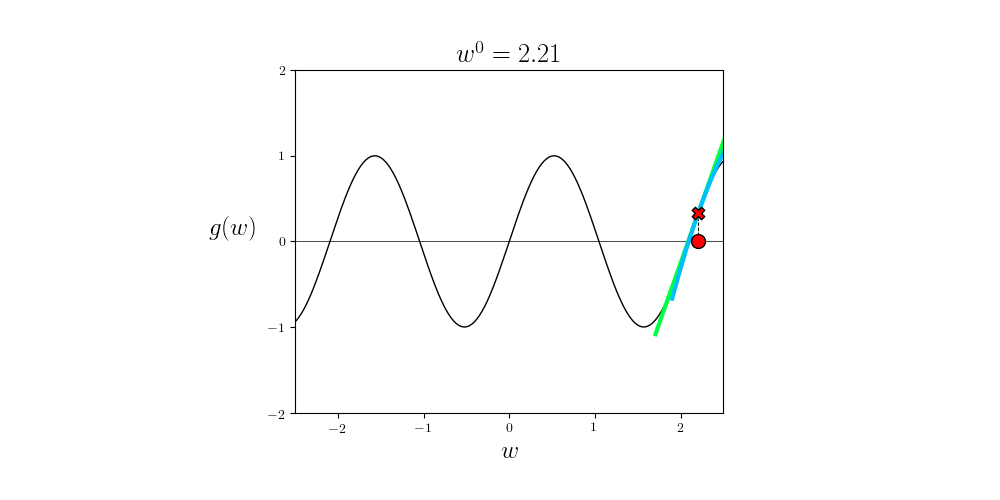
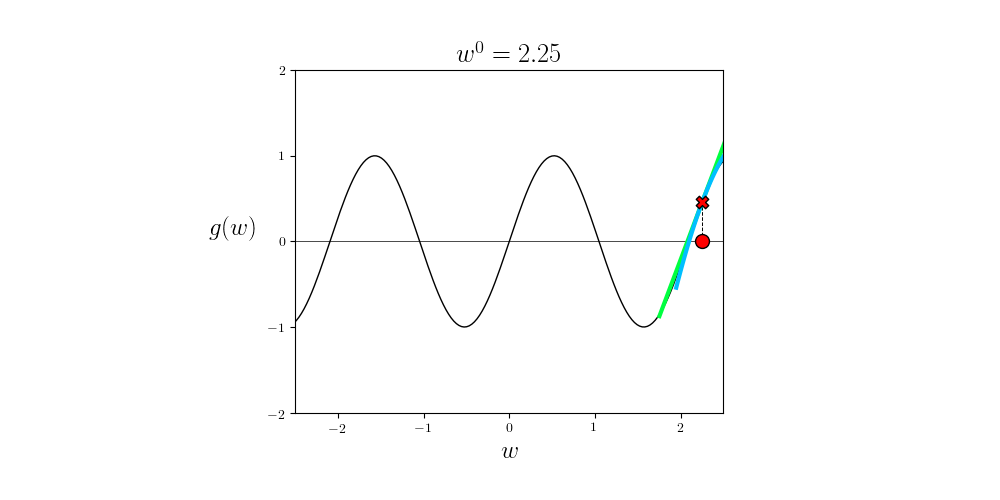
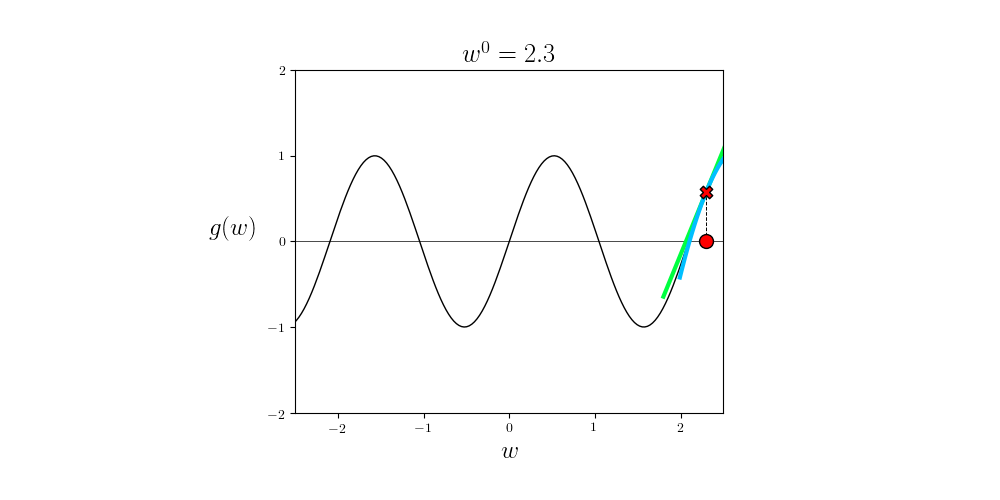

In [3]:
g = lambda w: np.sin(3*w);
test = calclib.taylor2d_viz.visualizer(g = g)
test.draw_it(num_frames = 100,first_order = True,second_order = True)

## B.7.3  Building better and better local approximations

Having derived this quadratic based on our reflection on the tangent line, one could think of going one step further.  That is finding a simple function $h$ that satisfies even one more condition than the quadratic 

\begin{array}
\
1. \,\,\, h(w^0) = g(w^0) \\
2. \,\,\, \frac{\mathrm{d}}{\mathrm{d}w}h(w^0) = \frac{\mathrm{d}}{\mathrm{d}w}g(w^0) \\
3. \,\,\, \frac{\mathrm{d}^2}{\mathrm{d}w^2}h(w^0) = \frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0) \\
4. \,\,\, \frac{\mathrm{d}^3}{\mathrm{d}w^3}h(w^0) = \frac{\mathrm{d}^3}{\mathrm{d}w^3}g(w^0) \\
\end{array} 

Noting that no degree 2 polynomial could satisfy this last condition, since its third derivative is always equal to zero, we could seek out a degree 3 polynomial.  Using the same analysis as above - setting up the corresponding system of equations based on a generic degree 3 polynomial - leads to the conclusion that the following does indeed satisfy all of the criteria above

\begin{equation}
h(w) = g(w^0) + \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)(w - w^0) +  \frac{1}{2}\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0)(w - w^0)^2 + \frac{1}{3\times2}\frac{\mathrm{d}^3}{\mathrm{d}w^3}g(w^0)(w - w^0)^3
\end{equation}

This is an even better approximation of $g$ near the point $w^0$, since it contains more of the function's derivative information there.

And of course we could keep going.  Setting up the corresponding set of $N+1$ criteria - the first demanding that $h(w^0) = g(w^0)$ and the remaining $N$ demanding that the first $n$ derivatives of $h$ match those of $g$ at $w^0$ - leads to the construction of degree $N$ polynomial

\begin{equation}
h(w^0) + g(w^0) + \sum_{n=1}^{N} \frac{1}{n!}\frac{\mathrm{d}^n}{\mathrm{d}w^n}g(w^0)(w - w^0)^n
\end{equation}

Notice how setting $N=1$ recovers the tangent line, $N=2$ the tangent quadratic, etc.,

This general degree $N$ polynomial is called the *Taylor Series* of $g$ at the point $w^0$.  It is *the* degree $N$ polynomial that matches $g$ as well as its first $N$ derivatives at the point $w^0$, and therefore approximates $g$ near this point better and better as we increase $N$.


We illustrate the first four Taylor Series polynomials for a user-defined input function below, animated over a range of values of the input function.  You can use the slider to shift the point at which each approximation is made back and forth across the input range.  


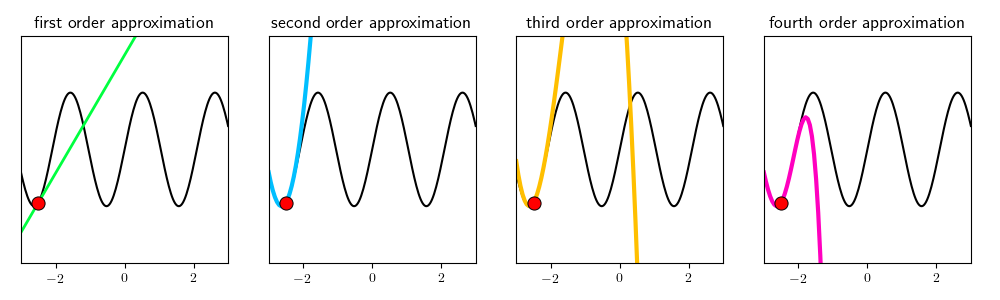
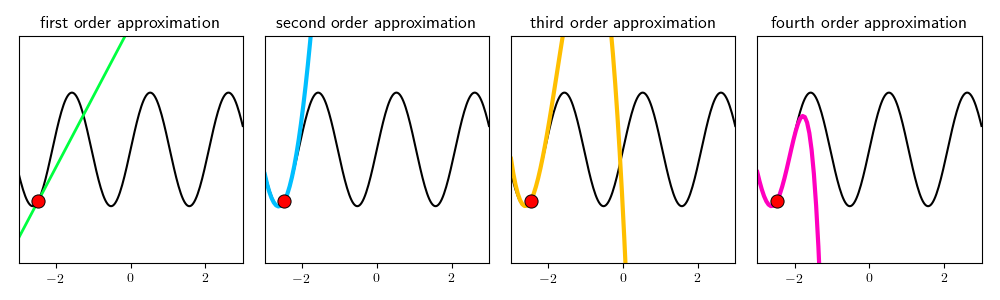
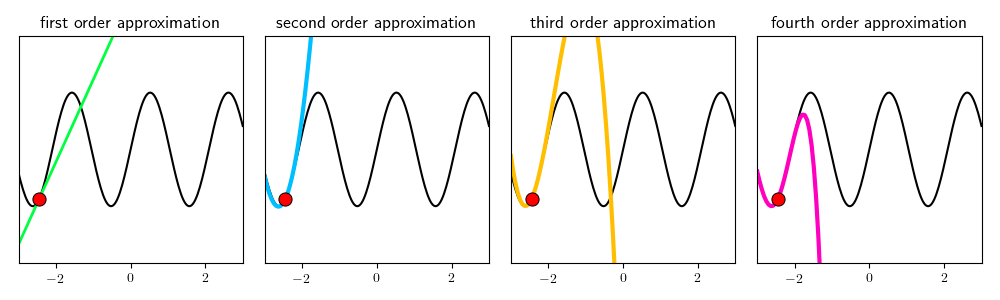
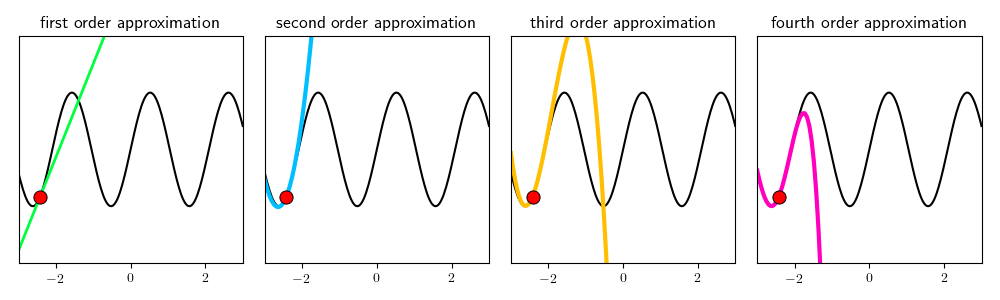
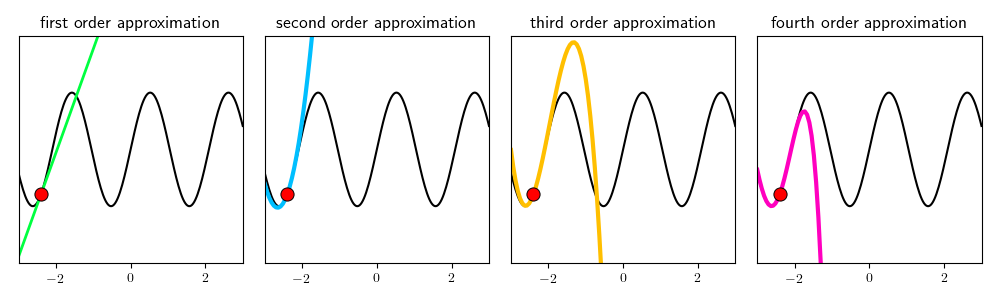
...
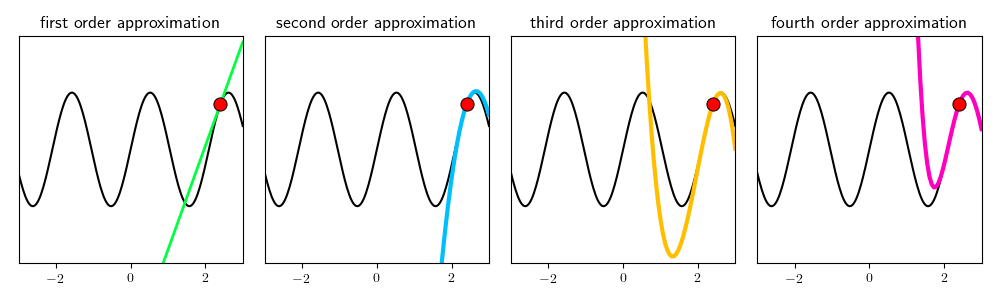
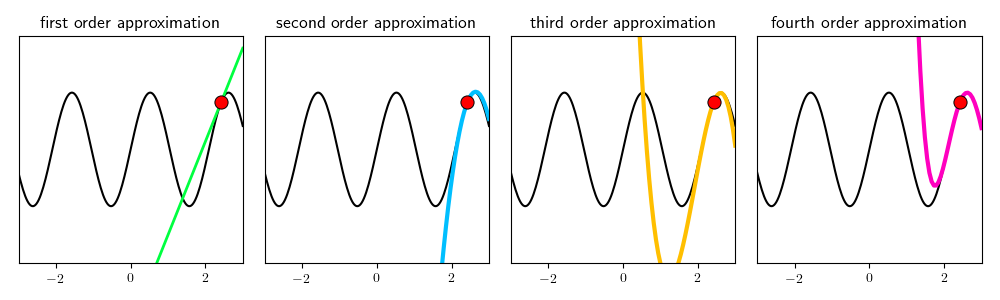
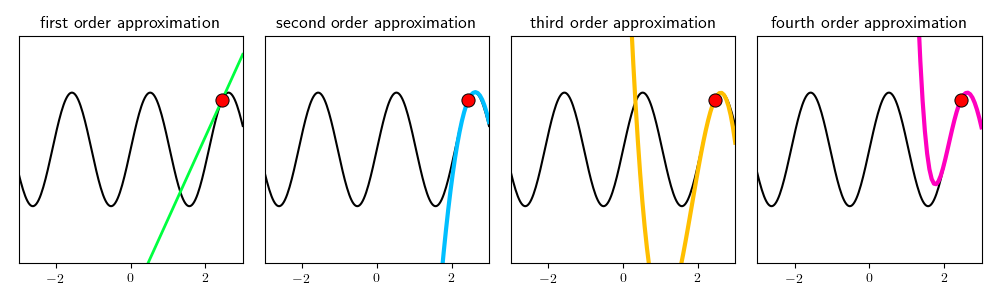
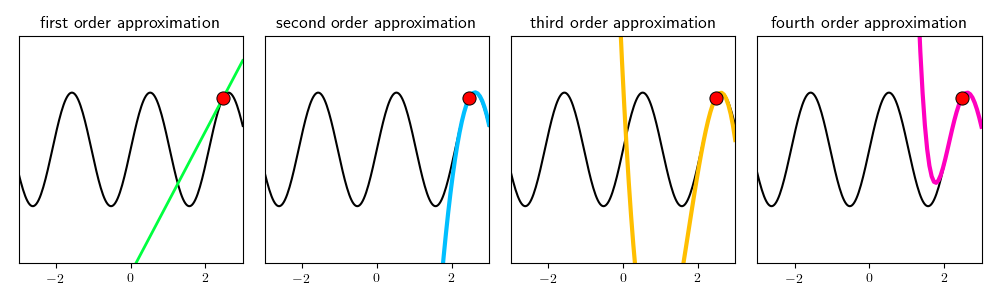
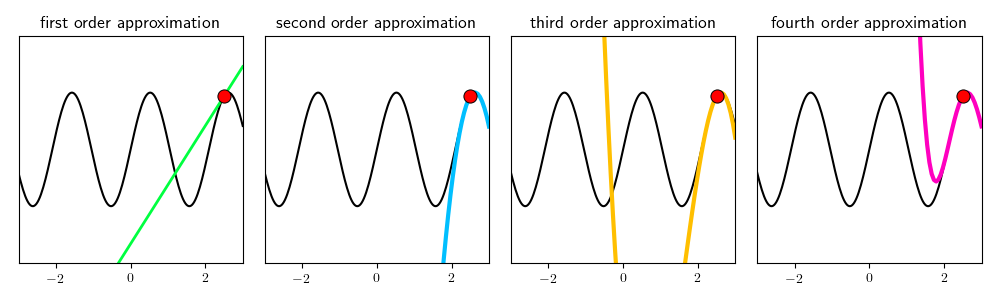

In [6]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.sin(3*w)

# create an instance of the visualizer with this function 
taylor_viz = calclib.taylor_series_simultaneous_approximations.visualizer(g = g)

# run the visualizer for our chosen input function
taylor_viz.draw_it(num_frames = 200)

Examining this figure we can clearly see that the approximation becomes better and better as we increase $N$.  This makes sense, as each polynomial matches the underlying function at a point as we increase the degree.  However we can never expect it to match the entire function everywhere: we build each polynomial to match $g$ at only a single point, so regardless of degree we can only expect it to match the underlying function near the point $w_0$. 

## B.7.4  Multi-input Taylor Series

We have now seen  - with single-input functions - how the general Taylor Series approximation can be thought of as a natural extension of the tangent line for higher degree polynomial approximations.  The story with multi-input functions is precisely the same. 

If we asked what sort of degree one polynomial $h(\mathbf{w})$ matched a function $g(\mathbf{w})$ at a point $\mathbf{w}^0$ in terms of both its function and gradient value there, i.e.,

\begin{array}
\
1. \,\,\, h\left(\mathbf{w}^0\right) = g\left(\mathbf{w}^0\right) \\
2. \,\,\, \nabla h\left(\mathbf{w}^0\right) = \nabla g\left(\mathbf{w}^0\right) \\
\end{array}

we could setup a system of equations (mirroring the one we setup when asking the analogous question for single-input functions) and recover the tangent hyperplane (our first order Taylor Series approximation)

\begin{equation}
h(\mathbf{w}^0) = g(\mathbf{w}^0) + \nabla g(\mathbf{w}^0)^T(\mathbf{w} - \mathbf{w}^0)
\end{equation}

Notice how this is the exact analog of the first order approximation for single-input functions, and reduces to it (a tangent line) when $N = 1$.

In the next Python cell we plot the first order Taylor Series approximation - shown in lime green - to the function $g(w_0,w_1) = \text{sin}(w_0)$ at a point.

<IPython.core.display.Javascript object>


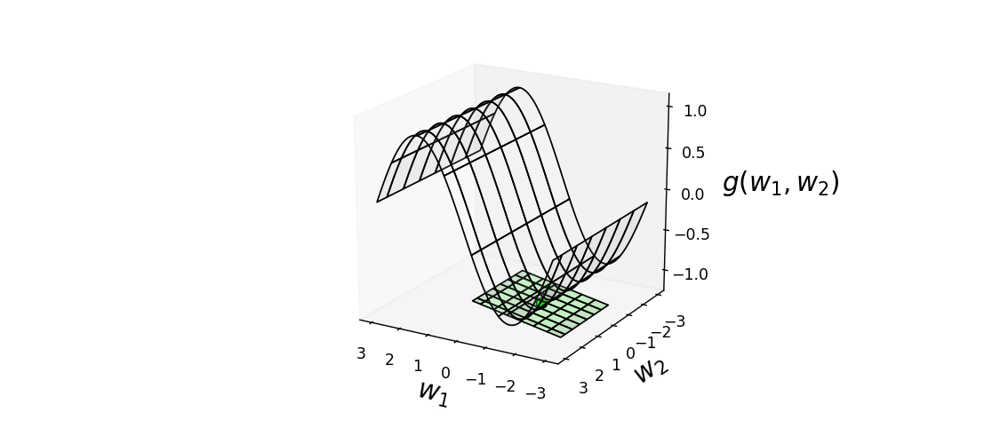

In [4]:
# create a function and point to compute approximation
g = lambda w: np.sin(w[0])
w_val = [-1.5,1]
view = [20,120]

# load in function to examine
viz = callib.taylor3d_viz.visualizer(g = g)

# start examination
viz.draw_it(w_val = w_val,view = view,first_order = True);

Likewise, inquiring about what sort of degree two (quadratic) function $h$ could match $g$ at a point $\mathbf{w}^0$ in terms of the value it takes, as well as the values its first and second derivatives take, i.e.,

\begin{array}
\
1. \,\,\, h\left(\mathbf{w}^0\right) = g\left(\mathbf{w}^0\right) \\
2. \,\,\, \nabla h\left(\mathbf{w}^0\right) = \nabla g\left(\mathbf{w}^0\right) \\
3. \,\,\, \nabla^2 h\left(\mathbf{w}^0\right) = \nabla^2 g\left(\mathbf{w}^0\right) \\
\end{array}

we would likewise derive (as we did explicitly with the single-input case) the second order Taylor Series approximation


\begin{equation}
h(\mathbf{w}) = g(\mathbf{w}^0) + \nabla g(\mathbf{w}^0)^T(\mathbf{w} - \mathbf{w}^0) + \frac{1}{2}(\mathbf{w} - \mathbf{w}^0)^T \nabla^2 g\left(\mathbf{w}^0\right) (\mathbf{w} - \mathbf{w}^0)
\end{equation}

Notice once again how this is the exact analog of the first order approximation for single-input functions, and reduces to it (a tangent quadratic) when $N = 1$.  Also note how this approximator is indeed a multi-input quadratic function (centered at $\mathbf{w}^0$), described in detail in the previous Section.  

This is perhaps easier to see if we make a few substitutions and rearrange the terms.  Briefly denoting $a =  g(\mathbf{w}^0)$, $\mathbf{b} = \nabla g(\mathbf{w}^0)$, and
$\mathbf{C} = \frac{1}{2}\nabla^2 g\left(\mathbf{w}^0\right)$ we can rewrite the above equivalently as

\begin{equation}
g(\mathbf{w}) = a + \mathbf{b}^T \left(\mathbf{w} - \mathbf{w}^0\right) + \left(\mathbf{w} - \mathbf{w}^0\right)^T \mathbf{C} \left(\mathbf{w} - \mathbf{w}^0\right)
\end{equation}

In any case the fact that the second order Taylor Series approximation is a multi-input quadratic means (among other things) that - for example - the general shape it takes on at a given point (its convexity or concavity along each input dimension) is entirely determined by the eigenvalues of $\nabla ^2 g\left(\mathbf{w}^0\right)$.

In the next Python cell we plot the first and second order Taylor Series approximation - shown in lime green and torquoise respectively - to the function $g(w_0,w_1) = \text{sin}(w_0)$ at a point.  As was the case with single-input functions the second order approximation is a much better local approximator than the first, as it contains more derivative information there.

<IPython.core.display.Javascript object>


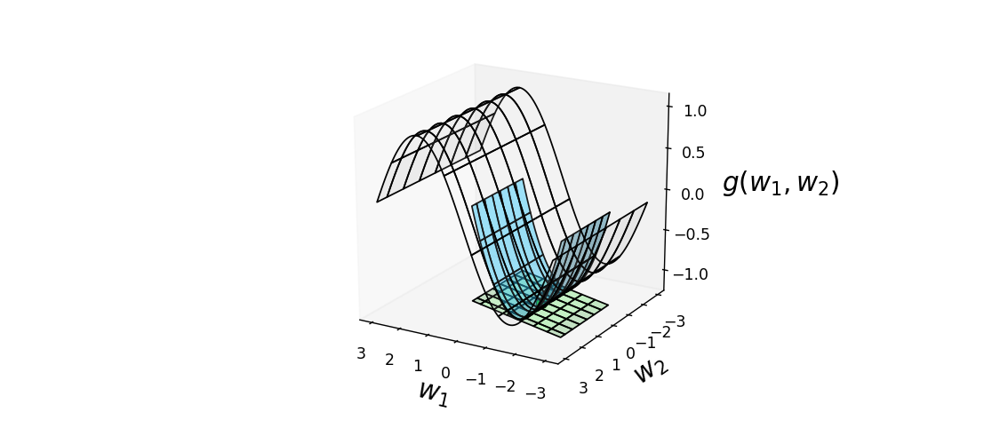

In [5]:
# create a function and point to compute approximation
g = lambda w: np.sin(w[0])
w_val = [-1.5,1]
view = [20,120]

# load in function to examine
viz = callib.taylor3d_viz.visualizer(g = g)

# start examination
viz.draw_it(w_val = w_val,view = view,first_order = True, second_order = True);

Higher order Taylor Series approximations can be defined precisely as in the single-input case.  The main difference with multi-input functions is that higher order  approximations - starting with the third order derivative - require serious manipulation of tensors of partial derivatives.

Again this can be readily defined, but practically speaking only approximations up to the second order are ever used in practice.  This is because - as we saw in the previous Section - the number of partial derivatives grows *exponentially* in the order of a derivative.   Thus even though we get a better (local) approximator as we increase the order of a Taylor series, the serious pitfall of calculating/storing exponentially many partial derivatives nullifies the benefit.

&copy; This material is not to be distributed, copied, or reused without written permission from the authors.